**Описание задачи**  
Вы сотрудник Отдела Data Science популярного музыкального стримингового сервиса "МиФаСоль". Сервис расширяет работу с новыми артистами и музыкантами, в связи с чем возникла задача - правильно классифицировать новые музыкальные треки, чтобы улучшить работу рекомендательной системы. Ваши коллеги из отдела работы со звуком подготовили датасет, в котором собраны некоторые характеристики музыкальных произведений и их жанры. Ваша задача - разработать модель, позволяющую классифицировать музыкальные произведения по жанрам.

**В ходе работы нужно рпойти все основные этапы полноценного исследования:**  
- загрузка и ознакомление с данными,
- предварительная обработка,
- полноценный разведочный анализ,
- разработка новых синтетических признаков,
- проверка на мультиколлинеарность,
- отбор финального набора обучающих признаков,
- выбор и обучение моделей,
- итоговая оценка качества предсказания лучшей модели,
- анализ важности ее признаков.

In [1]:
# !pip install pandas-profiling

In [2]:
# Импортируем нужные библиотеки
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
from sklearn.metrics import (confusion_matrix,
                             f1_score,
                             precision_score,
                             recall_score, 
                             roc_curve,
                             roc_auc_score,
                             accuracy_score,
                             fbeta_score,
                             make_scorer)
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline, make_pipeline, FeatureUnion
from sklearn.impute import SimpleImputer

In [3]:
def gscv (params_set, scorer, cv, features, target, model):
    Grid_CV = GridSearchCV(
        model, 
        error_score='raise',
        refit='fbeta_score',
        return_train_score=True,
        param_grid = params_set, 
        scoring = scorer, 
        verbose=2,
        cv = cv, 
        n_jobs = -1
    )

    pipe_grid = Grid_CV.fit(features, target)
    r = pd.DataFrame(pipe_grid.cv_results_)
    best_params = pipe_grid.best_params_
    best_score = pipe_grid.best_score_
    best_estimator = pipe_grid.best_estimator_
    return best_score, best_estimator



def model_lr_default(features, target, numeric, categorical):
    params_LR = {
        'classifier__class_weight':['balanced'],
        'classifier__penalty':['l1', 'l2'],
        'classifier__C': [1, 50],
        'classifier__solver': ['liblinear']
    }
    data_transformer = ColumnTransformer(transformers=[
        ("numerical", num_transformer, numeric),
        ("categorical", cat_transformer, categorical)
    ])
    preprocessor = Pipeline(steps=[("data_transformer", data_transformer)])
    classifier_pipline = Pipeline(
    steps=[("preprocessor", preprocessor), ("classifier", LogisticRegression(random_state=RANDOM_STATE))])
    best_score, best_estimator = gscv(params_LR, SCORER, 5, features, target, classifier_pipline)
    return best_score, best_estimator

def model_lr(features, target, numeric, categorical, params_LR):
    data_transformer = ColumnTransformer(transformers=[
        ("numerical", num_transformer, numeric),
        ("categorical", cat_transformer, categorical)
    ])
    preprocessor = Pipeline(steps=[("data_transformer", data_transformer)])
    classifier_pipline = Pipeline(
    steps=[("preprocessor", preprocessor), ("classifier", LogisticRegression(random_state=RANDOM_STATE))])
    best_score, best_estimator = gscv(params_LR, SCORER, 5, features, target, classifier_pipline)
    return best_score, best_estimator

def model_dtc_default(features, target, numeric, categorical):
    params_DTC = {
    'classifier__class_weight':['balanced'],
    'classifier__criterion': ['gini', 'entropy'],
    'classifier__max_depth': [101, 150],
    'classifier__min_samples_leaf': [1, 101],
    'classifier__min_samples_split': [21, 25],
    'classifier__max_leaf_nodes': [99, 101]
    }
    data_transformer = ColumnTransformer(transformers=[
    ("numerical", num_transformer, numeric),
    ("categorical", cat_transformer, categorical),
    ])
    preprocessor = Pipeline(steps=[("data_transformer", data_transformer)])
    classifier_pipline = Pipeline(
    steps=[("preprocessor", preprocessor), ("classifier", DecisionTreeClassifier(random_state=RANDOM_STATE))])
    best_score, best_estimator = gscv(params_DTC, SCORER, 5, features, target, classifier_pipline)
    return best_score, best_estimator

In [4]:
# Увеличим ширину ячеек для удобства
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
pd.options.mode.chained_assignment = None

C:\Users\artpr\AppData\Local\Temp\ipykernel_16008\2594548244.py:2: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


**Откроем файлы с данными и изучим их**

Нам предоставили два датасета:  
- данные для обучения модели - `kaggle_music_genre_train.csv`
- данные для тестирования модели - `kaggle_music_genre_test.csv`  

Сохраним их в переменные `df_train` и `df_test_kaggle`

In [5]:
# Загрузим датафреймы и сохраним их в переменные
df_train = pd.read_csv('kaggle_music_genre_train.csv')
df_test_kaggle = pd.read_csv('kaggle_music_genre_test.csv')

In [6]:
train = df_train
test = df_test_kaggle

In [7]:
RANDOM_STATE = 12345
SCORER = {
    'fbeta_score':make_scorer(fbeta_score,
                              beta=0.5,
                              average='macro')
}

Выведем первые пять строк для наших датафреймов.

In [8]:
for data in [train, test]:
    display(data.head().T)

,0,1,2,3,4
instance_id,25143.0,26091.0,87888.0,77021.0,20852.0
track_name,Highwayman,Toes Across The Floor,First Person on Earth,No Te Veo - Digital Single,Chasing Shadows
acousticness,0.48,0.243,0.228,0.0558,0.227
danceability,0.67,0.452,0.454,0.847,0.742
duration_ms,182653.0,187133.0,173448.0,255987.0,195333.0
energy,0.351,0.67,0.804,0.873,0.575
instrumentalness,0.0176,0.000051,0.0,0.000003,0.000002
key,D,A,E,G#,C
liveness,0.115,0.108,0.181,0.325,0.176
loudness,-16.842,-8.392,-5.225,-4.805,-5.55


,0,1,2,3,4
instance_id,48564,72394,88081,78331,72636
track_name,Low Class Conspiracy,The Hunter,Hate Me Now,Somebody Ain't You,Sour Mango
acousticness,0.301,0.538,0.00583,0.0203,0.000335
danceability,0.757,0.256,0.678,0.592,0.421
duration_ms,146213.0,240360.0,284000.0,177354.0,-1.0
energy,0.679,0.523,0.77,0.749,0.447
instrumentalness,0.0,0.00832,0.0,0.0,0.0148
key,A#,G#,A,B,D
liveness,0.303,0.0849,0.109,0.122,0.0374
loudness,-7.136,-5.175,-4.399,-4.604,-8.833


**Описание данных**  

Датафрейм `train` содержит столбцы:
- `instance_id` - уникальный идентификатор трека;
- `track_name` - название трека;
- `acousticness` - акустичность;
- `danceability` - танцевальность;
- `duration_ms` -продолжительность в милисекундах;
- `energy` - энергичность;
- `instrumentalness` - инструментальность;
- `key` - базовый ключ (нота) произведения;
- `liveness` - привлекательность;
- `loudness` - громкость;
- `mode` - указывает на модальность (мажорную или минорную) трека;
- `speechiness` - выразительность;
- `tempo` - темп;
- `obtained_date` - дата загрузки в сервис;
- `valence` - привлекательность произведения для пользователей сервиса;
- `music_genre` - музыкальный жанр.  

Датафрейм `test` содержит те же стобцы, что и `train`, кроме  `music_genre`.

Перейдем к предобработке и исследовательскому анализу данных.

#### Датафрейм `train`

In [9]:
display(train.info())
display(train.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20394 entries, 0 to 20393
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       20394 non-null  float64
 1   track_name        20394 non-null  object 
 2   acousticness      20394 non-null  float64
 3   danceability      20394 non-null  float64
 4   duration_ms       20394 non-null  float64
 5   energy            20394 non-null  float64
 6   instrumentalness  20394 non-null  float64
 7   key               19659 non-null  object 
 8   liveness          20394 non-null  float64
 9   loudness          20394 non-null  float64
 10  mode              19888 non-null  object 
 11  speechiness       20394 non-null  float64
 12  tempo             19952 non-null  float64
 13  obtained_date     20394 non-null  object 
 14  valence           20394 non-null  float64
 15  music_genre       20394 non-null  object 
dtypes: float64(11), object(5)
memory usage: 

None

instance_id           0
track_name            0
acousticness          0
danceability          0
duration_ms           0
energy                0
instrumentalness      0
key                 735
liveness              0
loudness              0
mode                506
speechiness           0
tempo               442
obtained_date         0
valence               0
music_genre           0
dtype: int64

Воспользуемся библиотекой модулем `ProfileReport` из библиотеки `ydata_profiling`

In [10]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В датафрейме `train` 20394 строки. Есть пропущенные значения в столбцах:
- `key` - 735 пропущенных значений;
- `mode` - 506 пропущенных значений;
- `tempo` - 442 пропущенных значения.  

Столбец `instance_id` содержит данные,которые должны быть целочисленными. Изменим тип данных этих значений.

In [11]:
train['instance_id'] = train['instance_id'].astype('int64')

In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20394 entries, 0 to 20393
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       20394 non-null  int64  
 1   track_name        20394 non-null  object 
 2   acousticness      20394 non-null  float64
 3   danceability      20394 non-null  float64
 4   duration_ms       20394 non-null  float64
 5   energy            20394 non-null  float64
 6   instrumentalness  20394 non-null  float64
 7   key               19659 non-null  object 
 8   liveness          20394 non-null  float64
 9   loudness          20394 non-null  float64
 10  mode              19888 non-null  object 
 11  speechiness       20394 non-null  float64
 12  tempo             19952 non-null  float64
 13  obtained_date     20394 non-null  object 
 14  valence           20394 non-null  float64
 15  music_genre       20394 non-null  object 
dtypes: float64(10), int64(1), object(5)
memo

Значения в столбце `instance_id` приведены к типу `int64`.

Создадим переменную и загрузим в нее датасет без пропущенных значений.

In [13]:
train_no_passes = train.query('~ key.isnull() and ~ mode.isnull() and ~ tempo.isnull()')

In [14]:
train_no_passes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18754 entries, 0 to 20393
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       18754 non-null  int64  
 1   track_name        18754 non-null  object 
 2   acousticness      18754 non-null  float64
 3   danceability      18754 non-null  float64
 4   duration_ms       18754 non-null  float64
 5   energy            18754 non-null  float64
 6   instrumentalness  18754 non-null  float64
 7   key               18754 non-null  object 
 8   liveness          18754 non-null  float64
 9   loudness          18754 non-null  float64
 10  mode              18754 non-null  object 
 11  speechiness       18754 non-null  float64
 12  tempo             18754 non-null  float64
 13  obtained_date     18754 non-null  object 
 14  valence           18754 non-null  float64
 15  music_genre       18754 non-null  object 
dtypes: float64(10), int64(1), object(5)
memory us

In [15]:
18754 * 100 / 20394

91.95841914288516

Мы удалили 8.04% данных. Осталось 91.96% данных. С ними и будем работать.

Разделим данные на признаки (features) и целевой признак (target).  

Целевым признаком будет музыкальный жанр - столбец `music_genre`.  

Признаками будут все столбцы, кроме:
 - `instance_id` - неинформативен для построения модели машинного обучения;
 - `track_name` - неинформативен для построения модели машинного обучения;
 - `obtained_date` - неинформативен для построения модели машинного обучения.  

In [17]:
features = train_no_passes.drop(['instance_id', 'track_name', 'obtained_date', 'music_genre'], axis=1)
target = train_no_passes['music_genre'] 

Посмотрим на баланс классов целевого признака:

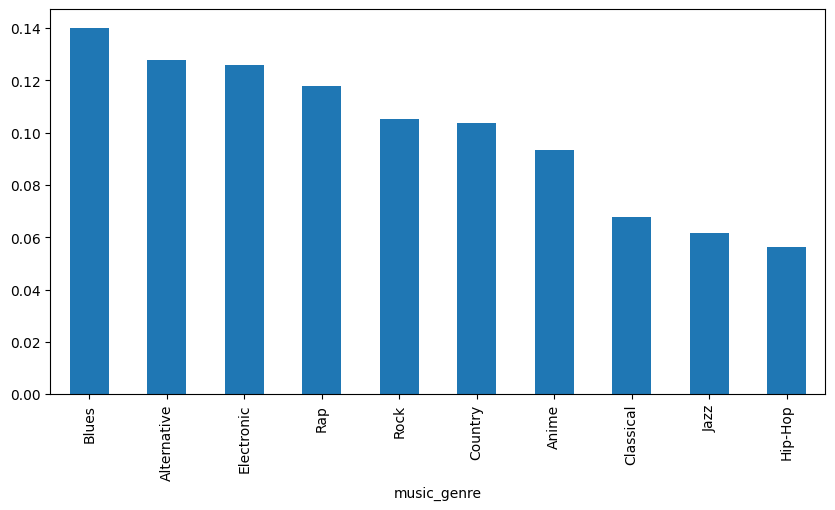

In [18]:
balance_class = target.value_counts(normalize=1)
balance_class.plot.bar(figsize = (10, 5));

В целевом признаке наблюдается дисбаланс классов.  
Чаще всего встречается жанр `Blues`. `Hip-Hop` - самый редкий.

In [19]:
cat = features.select_dtypes(include='object').columns
cat

Index(['key', 'mode'], dtype='object')

In [20]:
numeric = features.select_dtypes(include=np.number).columns
numeric

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')

In [21]:
num_transformer = Pipeline(steps=[
    ("scaler", StandardScaler())
])

cat_transformer = Pipeline(steps=[
    ("onehot", OneHotEncoder(drop='first', handle_unknown="ignore")),
])

In [22]:
%%time
best_score, best_estimator = model_lr_default(features, target, numeric, cat)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: total: 688 ms
Wall time: 7.32 s


In [23]:
display(best_score, best_estimator)

0.3686059469470049

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 LogisticRegression(C=50, class_weight='balanced', penalty='l1',
                                    random_state=12345, solver='liblinear'))])

Модель `LogisticRegression` с параметрами `C=50, class_weight='balanced', penalty='l1', random_state=12345, solver='liblinear'`:
 - F-Beta: `0.3686059469470049`

In [24]:
%%time
best_score, best_estimator = model_dtc_default(features, target, numeric, cat)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
CPU times: total: 1.36 s
Wall time: 13.5 s


In [25]:
display(best_score, best_estimator)

0.3608280432397577

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 DecisionTreeClassifier(class_weight='balanced',
                                        criterion='entropy', max_depth=101,
                                        max_leaf_nodes=99, min_samples_split=21,
                                        random_state=12345))])

Модель `DecisionTreeClassifier` с параметрами `class_weight='balanced', criterion='entropy', max_depth=101, max_leaf_nodes=99, min_samples_split=21, random_state=12345`:
- F-Beta: `0.3608280432397577`  

`Логистическая регрессия` справилась с задачей лучше.

Далее я попробовал сложить танцевальность и энергичность (просто поэксперементировать) - ничего толкового из этого не вышло, так что закомменитировал этот кусок кода..

In [26]:
# features['danceability + energy'] = features['danceability'] + features['energy']

In [27]:
# numeric = features.select_dtypes(include=np.number).columns
# numeric

In [28]:
# %%time
# best_score, best_estimator = model_lr_default(features, target, numeric, cat)

In [29]:
# display(best_score, best_estimator)

In [30]:
# features = features.drop('danceability + energy', axis=1)
# features.columns

Столбец `продолжительность в милисекундах` (`duration_ms`) содержит значения `-1`. Такого быть не должно.  
Сначала попробуем их удалить и проверим как изменится `F-Beta` у `Логистической регрессии`.

In [31]:
train = train_no_passes.query('duration_ms > 0')

In [32]:
features = train.drop(['instance_id', 'track_name', 'obtained_date', 'music_genre'], axis=1)
target = train['music_genre'] 

In [33]:
numeric = features.select_dtypes(include=np.number).columns
numeric

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')

In [34]:
%%time
best_score, best_estimator = model_lr_default(features, target, numeric, cat)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: total: 688 ms
Wall time: 6.01 s


In [35]:
display(best_score, best_estimator)

0.3714476318762935

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 LogisticRegression(C=1, class_weight='balanced', penalty='l1',
                                    random_state=12345, solver='liblinear'))])

`LogisticRegression` с параметрами `C=1, class_weight='balanced', penalty='l1', random_state=12345, solver='liblinear'`:
- F-Beta: `0.3714476318762935`  

Стало чуть лучше.

Теперь попробуем заменить все значения `-1` в столбце `duration_ms` на медианные и посмотрим на той же моделе.

In [36]:
train = train_no_passes

In [37]:
train['duration_ms'] = train['duration_ms'].replace(-1, np.NaN)
train['duration_ms'] = train.duration_ms.fillna(train['duration_ms'].median())

In [38]:
features = train.drop(['instance_id', 'track_name', 'obtained_date', 'music_genre'], axis=1)
target = train['music_genre'] 

In [39]:
numeric = features.select_dtypes(include=np.number).columns
numeric

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')

In [40]:
%%time
best_score, best_estimator = model_lr_default(features, target, numeric, cat)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: total: 594 ms
Wall time: 6.42 s


In [41]:
display(best_score, best_estimator)

0.37143985130742985

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 LogisticRegression(C=50, class_weight='balanced', penalty='l1',
                                    random_state=12345, solver='liblinear'))])

При тех же гиперпараметрах значение `F-Beta`: `0.37143985130742985`.  
Различия не значительны, поэтому оставлю с медианными значениями, да и выборка не будет сокращаться, в отличае от удаления.

До этого момента я использовал модель с очень ограниченным диапазоном гиперпараметров. Попробуем их расширить.

In [42]:
%%time
params_LR = {
        'classifier__class_weight':['balanced'],
        'classifier__penalty':['l1', 'l2'],
        'classifier__C': [1, 5, 15, 25, 50],
        'classifier__max_iter': [16],
        'classifier__max_iter': range(1, 21),
        'classifier__solver': ['liblinear']
}
best_score, best_estimator = model_lr(features, target, numeric, cat, params_LR)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
CPU times: total: 9.5 s
Wall time: 2min 33s


C:\Users\artpr\anaconda3\envs\ds_practicum_env\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [43]:
display(best_score, best_estimator)

0.3718317547250992

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 LogisticRegression(C=1, class_weight='balanced', max_iter=15,
                                    penalty='l1', random_state=12345,
                                    solver='liblinear'))])

`F-Beta` увеличилась всего на 0.0004... и стала равной `0.3718317547250992`.  
Результат, мягко говоря, не очень хороший.  

Расширим наш датасет данными из открытых источников.

In [44]:
music_genre = pd.read_csv('music_genre.csv')

In [45]:
music_genre['instance_id'] = pd.to_numeric(music_genre['instance_id'], errors='coerce').fillna(0).astype('int64')

In [46]:
music_genre = music_genre[df_train.columns]

In [47]:
music_genre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50005 entries, 0 to 50004
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       50005 non-null  int64  
 1   track_name        50000 non-null  object 
 2   acousticness      50000 non-null  float64
 3   danceability      50000 non-null  float64
 4   duration_ms       50000 non-null  float64
 5   energy            50000 non-null  float64
 6   instrumentalness  50000 non-null  float64
 7   key               50000 non-null  object 
 8   liveness          50000 non-null  float64
 9   loudness          50000 non-null  float64
 10  mode              50000 non-null  object 
 11  speechiness       50000 non-null  float64
 12  tempo             50000 non-null  object 
 13  obtained_date     50000 non-null  object 
 14  valence           50000 non-null  float64
 15  music_genre       50000 non-null  object 
dtypes: float64(9), int64(1), object(6)
memor

Датасет содержит 50000 новых треков.

Столбец `tempo` содержит в себе числовые значения, но который являются строковыми. Исправим. 

In [48]:
music_genre['tempo'] = pd.to_numeric(music_genre.tempo, errors='coerce')

Объединим датасеты в один.

In [49]:
frames = [df_train, music_genre]

df_test = pd.concat(frames, ignore_index=True, sort=False)

In [50]:
df_test

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,25143,Highwayman,0.48000,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,4-Apr,0.450,Country
1,26091,Toes Across The Floor,0.24300,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,4-Apr,0.539,Rock
2,87888,First Person on Earth,0.22800,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,4-Apr,0.344,Alternative
3,77021,No Te Veo - Digital Single,0.05580,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,4-Apr,0.966,Hip-Hop
4,20852,Chasing Shadows,0.22700,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,4-Apr,0.583,Alternative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70394,58878,GO GETTA,0.03340,0.913,-1.0,0.574,0.000000,C#,0.119,-7.022,Major,0.2980,98.028,4-Apr,0.330,Hip-Hop
70395,43557,Drama (feat. Drake),0.15700,0.709,251860.0,0.362,0.000000,B,0.109,-9.814,Major,0.0550,122.043,4-Apr,0.113,Hip-Hop
70396,39767,Lovin' Me (feat. Smiggz),0.00597,0.693,189483.0,0.763,0.000000,D,0.143,-5.443,Major,0.1460,131.079,4-Apr,0.395,Hip-Hop
70397,57944,Shawty Is Da Shit,0.08310,0.782,262773.0,0.472,0.000000,G,0.106,-5.016,Minor,0.0441,75.886,4-Apr,0.354,Hip-Hop


Получилось 70399 треков

In [51]:
train_no_passes = df_test.query('~ key.isnull() and ~ mode.isnull() and ~ tempo.isnull()')

In [52]:
train_no_passes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 63774 entries, 0 to 70398
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       63774 non-null  int64  
 1   track_name        63774 non-null  object 
 2   acousticness      63774 non-null  float64
 3   danceability      63774 non-null  float64
 4   duration_ms       63774 non-null  float64
 5   energy            63774 non-null  float64
 6   instrumentalness  63774 non-null  float64
 7   key               63774 non-null  object 
 8   liveness          63774 non-null  float64
 9   loudness          63774 non-null  float64
 10  mode              63774 non-null  object 
 11  speechiness       63774 non-null  float64
 12  tempo             63774 non-null  float64
 13  obtained_date     63774 non-null  object 
 14  valence           63774 non-null  float64
 15  music_genre       63774 non-null  object 
dtypes: float64(10), int64(1), object(5)
memory us

In [53]:
features = train_no_passes.drop(['instance_id', 'track_name', 'obtained_date', 'music_genre'], axis=1)
target = train_no_passes['music_genre']

In [54]:
numeric = features.select_dtypes(include=np.number).columns
numeric

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')

In [55]:
%%time
best_score, best_estimator = model_lr_default(features, target, numeric, cat)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: total: 3.08 s
Wall time: 21.8 s


In [56]:
display(best_score, best_estimator)

0.37820941811560155

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 LogisticRegression(C=1, class_weight='balanced', penalty='l1',
                                    random_state=12345, solver='liblinear'))])

In [57]:
%%time
params_LR = {
        'classifier__class_weight':['balanced'],
        'classifier__penalty':['l1', 'l2'],
        'classifier__C': [1, 5, 15, 25, 50],
        'classifier__max_iter': [16],
        'classifier__max_iter': range(1, 21),
        'classifier__solver': ['liblinear']
}
best_score, best_estimator = model_lr(features, target, numeric, cat, params_LR)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
CPU times: total: 35 s
Wall time: 8min 55s


C:\Users\artpr\anaconda3\envs\ds_practicum_env\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [58]:
display(best_score, best_estimator)

0.3786645135271193

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 LogisticRegression(C=1, class_weight='balanced', max_iter=6,
                                    penalty='l1', random_state=12345,
                                    solver='liblinear'))])

На Логистической регрессии с огранченными и расширенными гиперпараметрами `F-Beta` стала равной `0.37820941811560155` и `0.3786645135271193`

Попробуем посмотреть `F-Beta` на `Случайном лесе`.

In [59]:
%%time
params_RFC = {
    'classifier__class_weight':['balanced'],
    'classifier__n_estimators':range(1, 22),
    'classifier__max_depth': range(1, 22),
    'classifier__min_samples_split': range(2, 5),
    'classifier__min_samples_leaf': range(2, 5)
}

data_transformer = ColumnTransformer(transformers=[
("numerical", num_transformer, numeric),
("categorical", cat_transformer, cat),
])
preprocessor = Pipeline(steps=[("data_transformer", data_transformer)])

classifier_pipline = Pipeline(
steps=[("preprocessor", preprocessor), ("classifier", RandomForestClassifier(random_state=RANDOM_STATE))])
best_score, best_estimator = gscv (params_RFC, SCORER, 5, features, target, classifier_pipline)

Fitting 5 folds for each of 3969 candidates, totalling 19845 fits
CPU times: total: 11min 13s
Wall time: 2h 6min 16s


In [60]:
display(best_score, best_estimator)

0.6683384235035914

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 RandomForestClassifier(class_weight='balanced', max_depth=21,
                                        min_samples_leaf=2, n_estimators=21,
                                        random_state=12345))])

При значениях `RandomForestClassifier`: `class_weight='balanced', max_depth=21, min_samples_leaf=2, n_estimators=21, random_state=12345`:
- F-Beta = `0.6683384235035914`.  

Достаточно неплохой результат.
Правда время подбора гиперпараметров модели на моем ноутбуке увеличилось до `2h 6min 10s`.

Заменим значения `-1` в столбце `duration_ms` на медианные.

In [61]:
features['duration_ms'] = features['duration_ms'].replace( -1, np.NaN)
features['duration_ms'] = features.duration_ms.fillna(features['duration_ms'].median())

In [62]:
%%time
params_RFC = {
    'classifier__class_weight':['balanced'],
    'classifier__n_estimators':range(1, 22),
    'classifier__max_depth': range(1, 22),
    'classifier__min_samples_split': range(2, 5),
    'classifier__min_samples_leaf': range(2, 5)
}

data_transformer = ColumnTransformer(transformers=[
("numerical", num_transformer, numeric),
("categorical", cat_transformer, cat),
])
preprocessor = Pipeline(steps=[("data_transformer", data_transformer)])

classifier_pipline = Pipeline(
steps=[("preprocessor", preprocessor), ("classifier", RandomForestClassifier(random_state=RANDOM_STATE))])
best_score, best_estimator = gscv (params_RFC, SCORER, 5, features, target, classifier_pipline)

Fitting 5 folds for each of 3969 candidates, totalling 19845 fits
CPU times: total: 17min 8s
Wall time: 2h 48min 46s


In [63]:
display(best_score, best_estimator)

0.6671642155466013

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 RandomForestClassifier(class_weight='balanced', max_depth=21,
                                        min_samples_leaf=2, n_estimators=21,
                                        random_state=12345))])

F-Beta уменьшилась на 0.001 и стала равной `0.6671642155466013`

Так как я и так завалил все сроки (спасибо командировке...) и работу пора уже сдавать - оставлю как есть.

Проверим нашу модель на тестовой выборке.

In [64]:
test = df_test_kaggle
test1=test

In [65]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       5099 non-null   int64  
 1   track_name        5099 non-null   object 
 2   acousticness      5099 non-null   float64
 3   danceability      5099 non-null   float64
 4   duration_ms       5099 non-null   float64
 5   energy            5099 non-null   float64
 6   instrumentalness  5099 non-null   float64
 7   key               4941 non-null   object 
 8   liveness          5099 non-null   float64
 9   loudness          5099 non-null   float64
 10  mode              4950 non-null   object 
 11  speechiness       5099 non-null   float64
 12  tempo             4978 non-null   float64
 13  obtained_date     5099 non-null   object 
 14  valence           5099 non-null   float64
dtypes: float64(10), int64(1), object(4)
memory usage: 597.7+ KB


In [66]:
test = test.drop(['instance_id', 'track_name', 'obtained_date'], axis=1)

In [67]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      5099 non-null   float64
 1   danceability      5099 non-null   float64
 2   duration_ms       5099 non-null   float64
 3   energy            5099 non-null   float64
 4   instrumentalness  5099 non-null   float64
 5   key               4941 non-null   object 
 6   liveness          5099 non-null   float64
 7   loudness          5099 non-null   float64
 8   mode              4950 non-null   object 
 9   speechiness       5099 non-null   float64
 10  tempo             4978 non-null   float64
 11  valence           5099 non-null   float64
dtypes: float64(10), object(2)
memory usage: 478.2+ KB


Столбцы `tempo`, `key` и `mode` содержат пропущенные значения.  
В `tempo` заменим пропуски медианным значением.  
В `key` и `mode` заменим пропуски самыми часто встречающимися значениями.

In [70]:
test

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence
0,0.301000,0.757,146213.0,0.679,0.00000,A#,0.3030,-7.136,Minor,0.3560,90.361,0.895
1,0.538000,0.256,240360.0,0.523,0.00832,G#,0.0849,-5.175,Major,0.0294,78.385,0.318
2,0.005830,0.678,284000.0,0.770,0.00000,A,0.1090,-4.399,Minor,0.2220,90.000,0.412
3,0.020300,0.592,177354.0,0.749,0.00000,B,0.1220,-4.604,Major,0.0483,160.046,0.614
4,0.000335,0.421,-1.0,0.447,0.01480,D,0.0374,-8.833,Major,0.2020,73.830,0.121
...,...,...,...,...,...,...,...,...,...,...,...,...
5094,0.108000,0.558,163049.0,0.767,0.00000,E,0.0954,-4.561,Minor,0.0491,158.019,0.715
5095,0.131000,0.435,196216.0,0.641,0.00000,A#,0.2730,-7.274,Major,0.1040,115.534,0.156
5096,0.152000,0.756,243373.0,0.787,0.00000,D,0.2050,-7.423,Major,0.2400,123.405,0.459
5097,0.001450,0.489,185600.0,0.974,0.63800,F#,0.1230,-2.857,Minor,0.0381,150.036,0.665


In [71]:
myImputer = SimpleImputer (missing_values=np.nan, strategy='median', fill_value=None)
test.tempo = myImputer.fit_transform(test['tempo'].values.reshape(-1,1))

In [72]:
test = test.apply(lambda x:x.fillna(x.value_counts().index[0]))

In [73]:
test['mode'].unique()

array(['Minor', 'Major'], dtype=object)

In [74]:
test['key'].unique()

array(['A#', 'G#', 'A', 'B', 'D', 'F#', 'F', 'G', 'C', 'D#', 'C#', 'E'],
      dtype=object)

In [75]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      5099 non-null   float64
 1   danceability      5099 non-null   float64
 2   duration_ms       5099 non-null   float64
 3   energy            5099 non-null   float64
 4   instrumentalness  5099 non-null   float64
 5   key               5099 non-null   object 
 6   liveness          5099 non-null   float64
 7   loudness          5099 non-null   float64
 8   mode              5099 non-null   object 
 9   speechiness       5099 non-null   float64
 10  tempo             5099 non-null   float64
 11  valence           5099 non-null   float64
dtypes: float64(10), object(2)
memory usage: 478.2+ KB


Теперь сделаем предсказание используя модель `RandomForestClassifier` с гиперпараметрами `class_weight='balanced', max_depth=21, min_samples_leaf=2, n_estimators=21, random_state=12345` и отправим файл `test.csv` на kaggle посмотреть результат.

In [76]:
pred = best_estimator.predict(test)
pred = pred.ravel().tolist()
pred_series = pd.Series(pred, name='music_genre')
instance_id_column = test1['instance_id']
submit = pd.concat([instance_id_column, pred_series], axis=1)
submit.to_csv('test.csv', index=False)

![title](result.png)

***ВНИМАНИЕ!***  
Меня ОЧЕНЬ удивил результат на тестовой выборке и я начал все перепроверять.....  
И я все понял. Я не сравнил найденный датасет с датасетами, которые нам предоставили.. Не буду все переделывать (время 21:19, а я все еще на работе), допишу код ниже с лучшими гиперпараметрами Случайного леса, чтобы не перебирать все заново.

In [108]:
music_genre = pd.read_csv('music_genre.csv')

In [109]:
music_genre['instance_id'] = pd.to_numeric(music_genre['instance_id'], errors='coerce').fillna(0).astype('int64')

In [110]:
music_genre = music_genre[df_train.columns]

In [111]:
music_genre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50005 entries, 0 to 50004
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       50005 non-null  int64  
 1   track_name        50000 non-null  object 
 2   acousticness      50000 non-null  float64
 3   danceability      50000 non-null  float64
 4   duration_ms       50000 non-null  float64
 5   energy            50000 non-null  float64
 6   instrumentalness  50000 non-null  float64
 7   key               50000 non-null  object 
 8   liveness          50000 non-null  float64
 9   loudness          50000 non-null  float64
 10  mode              50000 non-null  object 
 11  speechiness       50000 non-null  float64
 12  tempo             50000 non-null  object 
 13  obtained_date     50000 non-null  object 
 14  valence           50000 non-null  float64
 15  music_genre       50000 non-null  object 
dtypes: float64(9), int64(1), object(6)
memor

Датасет содержит 50000 новых треков.

Столбец `tempo` содержит в себе числовые значения, но который являются строковыми. Исправим. 

In [112]:
music_genre['tempo'] = pd.to_numeric(music_genre.tempo, errors='coerce')

Объединим датасеты в один.

In [113]:
frames = [df_train, music_genre]

df_test = pd.concat(frames, ignore_index=True, sort=False)

In [114]:
df_test

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,25143,Highwayman,0.48000,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,4-Apr,0.450,Country
1,26091,Toes Across The Floor,0.24300,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,4-Apr,0.539,Rock
2,87888,First Person on Earth,0.22800,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,4-Apr,0.344,Alternative
3,77021,No Te Veo - Digital Single,0.05580,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,4-Apr,0.966,Hip-Hop
4,20852,Chasing Shadows,0.22700,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,4-Apr,0.583,Alternative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70394,58878,GO GETTA,0.03340,0.913,-1.0,0.574,0.000000,C#,0.119,-7.022,Major,0.2980,98.028,4-Apr,0.330,Hip-Hop
70395,43557,Drama (feat. Drake),0.15700,0.709,251860.0,0.362,0.000000,B,0.109,-9.814,Major,0.0550,122.043,4-Apr,0.113,Hip-Hop
70396,39767,Lovin' Me (feat. Smiggz),0.00597,0.693,189483.0,0.763,0.000000,D,0.143,-5.443,Major,0.1460,131.079,4-Apr,0.395,Hip-Hop
70397,57944,Shawty Is Da Shit,0.08310,0.782,262773.0,0.472,0.000000,G,0.106,-5.016,Minor,0.0441,75.886,4-Apr,0.354,Hip-Hop


Получилось 70399 треков

Удалим все треки, которые есть в тестовой выборке. Для этого сравним значения в столбце `instance_id`.

In [115]:
test_instance_id = df_test_kaggle['instance_id'].unique()
df_test = df_test.query("instance_id not  in @test_instance_id")

Теперь удалим дубликаты.

In [116]:
df_test.duplicated().sum()

18758

In [117]:
df_test = df_test.drop_duplicates().reset_index(drop=True)

In [118]:
df_test

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,25143,Highwayman,0.48000,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,4-Apr,0.450,Country
1,26091,Toes Across The Floor,0.24300,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,4-Apr,0.539,Rock
2,87888,First Person on Earth,0.22800,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,4-Apr,0.344,Alternative
3,77021,No Te Veo - Digital Single,0.05580,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,4-Apr,0.966,Hip-Hop
4,20852,Chasing Shadows,0.22700,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,4-Apr,0.583,Alternative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46537,28408,Barbie Doll,0.13300,0.849,237667.0,0.660,0.000008,C,0.296,-7.195,Major,0.0516,99.988,4-Apr,0.629,Hip-Hop
46538,58878,GO GETTA,0.03340,0.913,-1.0,0.574,0.000000,C#,0.119,-7.022,Major,0.2980,98.028,4-Apr,0.330,Hip-Hop
46539,43557,Drama (feat. Drake),0.15700,0.709,251860.0,0.362,0.000000,B,0.109,-9.814,Major,0.0550,122.043,4-Apr,0.113,Hip-Hop
46540,39767,Lovin' Me (feat. Smiggz),0.00597,0.693,189483.0,0.763,0.000000,D,0.143,-5.443,Major,0.1460,131.079,4-Apr,0.395,Hip-Hop


Осталось 46542 трека.

In [119]:
train_no_passes = df_test.query('~ key.isnull() and ~ mode.isnull() and ~ tempo.isnull()')

In [120]:
train_no_passes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39921 entries, 0 to 46541
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       39921 non-null  int64  
 1   track_name        39921 non-null  object 
 2   acousticness      39921 non-null  float64
 3   danceability      39921 non-null  float64
 4   duration_ms       39921 non-null  float64
 5   energy            39921 non-null  float64
 6   instrumentalness  39921 non-null  float64
 7   key               39921 non-null  object 
 8   liveness          39921 non-null  float64
 9   loudness          39921 non-null  float64
 10  mode              39921 non-null  object 
 11  speechiness       39921 non-null  float64
 12  tempo             39921 non-null  float64
 13  obtained_date     39921 non-null  object 
 14  valence           39921 non-null  float64
 15  music_genre       39921 non-null  object 
dtypes: float64(10), int64(1), object(5)
memory us

In [121]:
features = train_no_passes.drop(['instance_id', 'track_name', 'obtained_date', 'music_genre'], axis=1)
target = train_no_passes['music_genre']

In [122]:
numeric = features.select_dtypes(include=np.number).columns
numeric

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')

Заменим значения `-1` в столбце `duration_ms` на медианные.

In [123]:
features['duration_ms'] = features['duration_ms'].replace( -1, np.NaN)
features['duration_ms'] = features.duration_ms.fillna(features['duration_ms'].median())

In [124]:
%%time
params_LR = {
        'classifier__class_weight':['balanced'],
        'classifier__penalty':['l1', 'l2'],
        'classifier__C': [1, 5, 15, 25, 50],
        'classifier__max_iter': [16],
        'classifier__max_iter': range(1, 21),
        'classifier__solver': ['liblinear']
}
best_score, best_estimator = model_lr(features, target, numeric, cat, params_LR)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
CPU times: total: 21.3 s
Wall time: 5min 24s


C:\Users\artpr\anaconda3\envs\ds_practicum_env\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [125]:
display(best_score, best_estimator)

0.37884046453989634

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 LogisticRegression(C=15, class_weight='balanced', max_iter=12,
                                    penalty='l1', random_state=12345,
                                    solver='liblinear'))])

Модель `LogisticRegression` с гиперпараметрами `C=15, class_weight='balanced', max_iter=12, penalty='l1', random_state=12345, solver='liblinear'`:
- F-Beta: `0.37884046453989634`

In [126]:
%%time
params_RFC = {
    'classifier__class_weight':['balanced'],
    'classifier__n_estimators': [21],
    'classifier__max_depth': [21],
    'classifier__min_samples_split': [2],
    'classifier__min_samples_leaf': [2]
}

data_transformer = ColumnTransformer(transformers=[
("numerical", num_transformer, numeric),
("categorical", cat_transformer, cat),
])
preprocessor = Pipeline(steps=[("data_transformer", data_transformer)])

classifier_pipline = Pipeline(
steps=[("preprocessor", preprocessor), ("classifier", RandomForestClassifier(random_state=RANDOM_STATE))])
best_score, best_estimator = gscv (params_RFC, SCORER, 5, features, target, classifier_pipline)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
CPU times: total: 750 ms
Wall time: 4.78 s


In [127]:
display(best_score, best_estimator)

0.4127410137350568

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('data_transformer',
                                  ColumnTransformer(transformers=[('numerical',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')),
                                                                  ('categorical',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(drop='first',
                                                                                                  handle_unknown='ignore'))]),
                                                                   Index(['key', 'mode'], dtype='object'))]))])),
                ('classifier',
                 RandomForestClassifier(class_weight='balanced', max_depth=21,
                                        min_samples_leaf=2, n_estimators=21,
                                        random_state=12345))])

Модель `RandomForestClassifier` с гииперпараметрами `class_weight='balanced', max_depth=21, min_samples_leaf=2, n_estimators=21, random_state=12345`:
- F-Beta: `0.4127410137350568`

Проверим нашу модель `RandomForestClassifier` с гииперпараметрами `class_weight='balanced', max_depth=21, min_samples_leaf=2, n_estimators=21, random_state=12345` на тестовой выборке.

In [95]:
test = df_test_kaggle
test1=test

In [96]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       5099 non-null   int64  
 1   track_name        5099 non-null   object 
 2   acousticness      5099 non-null   float64
 3   danceability      5099 non-null   float64
 4   duration_ms       5099 non-null   float64
 5   energy            5099 non-null   float64
 6   instrumentalness  5099 non-null   float64
 7   key               4941 non-null   object 
 8   liveness          5099 non-null   float64
 9   loudness          5099 non-null   float64
 10  mode              4950 non-null   object 
 11  speechiness       5099 non-null   float64
 12  tempo             4978 non-null   float64
 13  obtained_date     5099 non-null   object 
 14  valence           5099 non-null   float64
dtypes: float64(10), int64(1), object(4)
memory usage: 597.7+ KB


In [97]:
test = test.drop(['instance_id', 'track_name', 'obtained_date'], axis=1)

In [98]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      5099 non-null   float64
 1   danceability      5099 non-null   float64
 2   duration_ms       5099 non-null   float64
 3   energy            5099 non-null   float64
 4   instrumentalness  5099 non-null   float64
 5   key               4941 non-null   object 
 6   liveness          5099 non-null   float64
 7   loudness          5099 non-null   float64
 8   mode              4950 non-null   object 
 9   speechiness       5099 non-null   float64
 10  tempo             4978 non-null   float64
 11  valence           5099 non-null   float64
dtypes: float64(10), object(2)
memory usage: 478.2+ KB


Столбцы `tempo`, `key` и `mode` содержат пропущенные значения.  
В `tempo` заменим пропуски медианным значением.  
В `key` и `mode` заменим пропуски самыми часто встречающимися значениями.

In [101]:
test

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence
0,0.301000,0.757,146213.0,0.679,0.00000,A#,0.3030,-7.136,Minor,0.3560,90.361,0.895
1,0.538000,0.256,240360.0,0.523,0.00832,G#,0.0849,-5.175,Major,0.0294,78.385,0.318
2,0.005830,0.678,284000.0,0.770,0.00000,A,0.1090,-4.399,Minor,0.2220,90.000,0.412
3,0.020300,0.592,177354.0,0.749,0.00000,B,0.1220,-4.604,Major,0.0483,160.046,0.614
4,0.000335,0.421,-1.0,0.447,0.01480,D,0.0374,-8.833,Major,0.2020,73.830,0.121
...,...,...,...,...,...,...,...,...,...,...,...,...
5094,0.108000,0.558,163049.0,0.767,0.00000,E,0.0954,-4.561,Minor,0.0491,158.019,0.715
5095,0.131000,0.435,196216.0,0.641,0.00000,A#,0.2730,-7.274,Major,0.1040,115.534,0.156
5096,0.152000,0.756,243373.0,0.787,0.00000,D,0.2050,-7.423,Major,0.2400,123.405,0.459
5097,0.001450,0.489,185600.0,0.974,0.63800,F#,0.1230,-2.857,Minor,0.0381,150.036,0.665


In [102]:
myImputer = SimpleImputer (missing_values=np.nan, strategy='median', fill_value=None)
test.tempo = myImputer.fit_transform(test['tempo'].values.reshape(-1,1))

In [103]:
test = test.apply(lambda x:x.fillna(x.value_counts().index[0]))

In [104]:
test['mode'].unique()

array(['Minor', 'Major'], dtype=object)

In [105]:
test['key'].unique()

array(['A#', 'G#', 'A', 'B', 'D', 'F#', 'F', 'G', 'C', 'D#', 'C#', 'E'],
      dtype=object)

In [106]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   acousticness      5099 non-null   float64
 1   danceability      5099 non-null   float64
 2   duration_ms       5099 non-null   float64
 3   energy            5099 non-null   float64
 4   instrumentalness  5099 non-null   float64
 5   key               5099 non-null   object 
 6   liveness          5099 non-null   float64
 7   loudness          5099 non-null   float64
 8   mode              5099 non-null   object 
 9   speechiness       5099 non-null   float64
 10  tempo             5099 non-null   float64
 11  valence           5099 non-null   float64
dtypes: float64(10), object(2)
memory usage: 478.2+ KB


Теперь сделаем предсказание используя модель `RandomForestClassifier` с гиперпараметрами `class_weight='balanced', max_depth=21, min_samples_leaf=2, n_estimators=21, random_state=12345` и отправим файл `test_final.csv` на kaggle посмотреть результат.

In [107]:
pred = best_estimator.predict(test)
pred = pred.ravel().tolist()
pred_series = pd.Series(pred, name='music_genre')
instance_id_column = test1['instance_id']
submit = pd.concat([instance_id_column, pred_series], axis=1)
submit.to_csv('test_final.csv', index=False)

![title](result_final.png)

Вот теперь результат похож на правду. Предыдущий результат мне нравится больше, но что поделать.

**Вывод**  
В ходе работы мы:
- провели предобработку данных:
    - изменили тип данных в столбце `instance_id`;
    - обнаружили и восстановили пропущенные значения в столбцах:
        - `key` и `mode` - самыми часто встречающимися значениями;
        - `tempo` - медианным значением;
     - обучили две модели:
        - `Логистическая регрессия` и `Случайный лес`.  
     Лучшей оказалась модель `Случайный лес` с гиперпараметрами `class_weight='balanced', max_depth=21, min_samples_leaf=2, n_estimators=21, random_state=12345`. F-Beta: `0.4127410137350568`
     - Проверили нашу модель на тестовой выборке. Результат на Kaggle:
     ![title](result_final.png)  
     
Результат очень плохой, но нужно сдавать работу и продолжать обучение. В дальнейшем планирую вернуться к этой работе и продолжить исследование (когда появится свободное время).